In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import time

import matplotlib.pyplot as plt


from WrapScalableSVM import *
from Utils_SSVM import *
from utilsData import *
from modelEvaluation import *
from utilsPlot import *

import plotly.graph_objects as go

import joblib
import os
from os.path import exists
import re

import anchor
import anchor.anchor_tabular
from AnchorGeneration import *
from RuleEvaluation import *

# Explainable and Reliable AI for simulated safe social navigation

NavGround Simulator tool: https://idsia-robotics.github.io/navground/ 


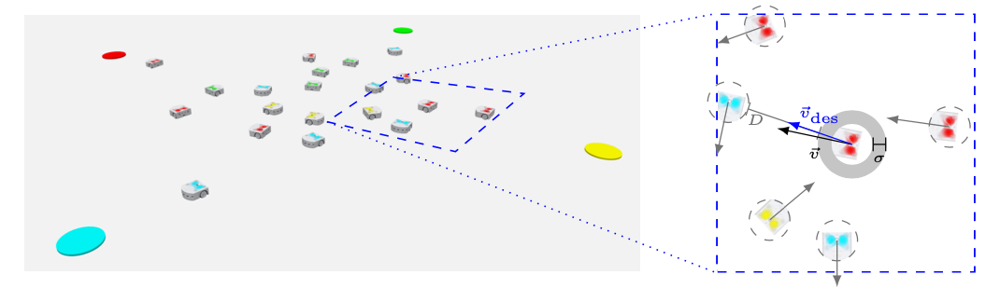


**Simulation parameters**:

- Safety margin $\sigma \in [0.0, 0.1]$ m;
- Relaxation time $\tau \in [0, 1]$ s;
- Minimal time required to stop and avoid to collide $\eta \in [0,1]$ s;

**Output**
- non-collision (0 collisions)
- collision


## Load datasets

In [2]:
datapath = "simulation2/"
train = "train.csv"
test = "test.csv"
cal = "calib.csv"

In [3]:
dbtrain = pd.read_csv(datapath+train)
dbtest = pd.read_csv(datapath+test)
dbcal = pd.read_csv(datapath+cal)

## Preprocessing
Separate features and labels, and convert label 0 with 1 and 1 with -1 (required to comply with scalable classifiers theory)

In [4]:
Xtr = dbtrain[['SafetyMargin', 'Eta', 'Tau']].values
Ytr = dbtrain[['output']].values
Ytr[Ytr==1] = -1
Ytr[Ytr==0] = 1

Xts = dbtest[['SafetyMargin', 'Eta', 'Tau']].values
Yts = dbtest[['output']].values
Yts[Yts==1] = -1
Yts[Yts==0] = 1

Xcal = dbcal[['SafetyMargin', 'Eta', 'Tau']].values
Ycal = dbcal[['output']].values
Ycal[Ycal==1] = -1
Ycal[Ycal==0] = 1

## Features exploration

/usr/local/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


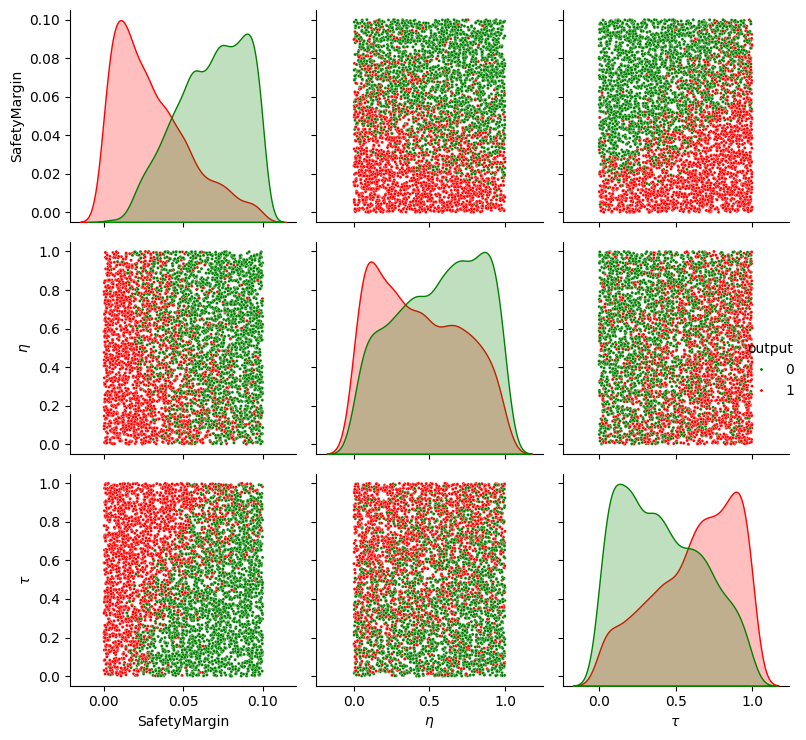

In [5]:
colors = ["green","red"]
g = sns.pairplot(dbcal, hue = "output", plot_kws={"s": 5}, palette = colors)
#ax.set(xlabels)
replacements = {'SafetyMargin': "SafetyMargin", 'Eta': r'$\eta$', 'Tau': r'$\tau$'}

for i in range(3):
    for j in range(3):
        xlabel = g.axes[i][j].get_xlabel()
        ylabel = g.axes[i][j].get_ylabel()
        if xlabel in replacements.keys():
            g.axes[i][j].set_xlabel(replacements[xlabel])
        if ylabel in replacements.keys():
            g.axes[i][j].set_ylabel(replacements[ylabel])

plt.tight_layout()

# PART A) 
## Probabilistic/Conformal Safety Regions via Scalable SVM
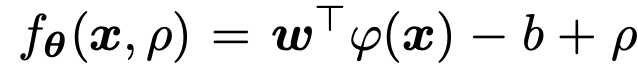


In [5]:
# Parameters settings
kernel = "polynomial"
param = 3
tau = np.array([[0.5]])
eta = 0.3

### 1) Classic SVM training ($\rho$ = 0)

In [6]:
start_time = time.time()
model = ScalableSVMClassifier(eta, kernel, param, tau)
model.get_params()
model = model.fit(Xtr,Ytr)
end_time = time.time()

elapsed_time = end_time - start_time

print(f"Elapsed time: {elapsed_time} seconds")

Elapsed time: 133.74969911575317 seconds


In [7]:
model = model.FPcontrol(Xcal, Ycal, 0.1,'classic')
model.b_eps

0

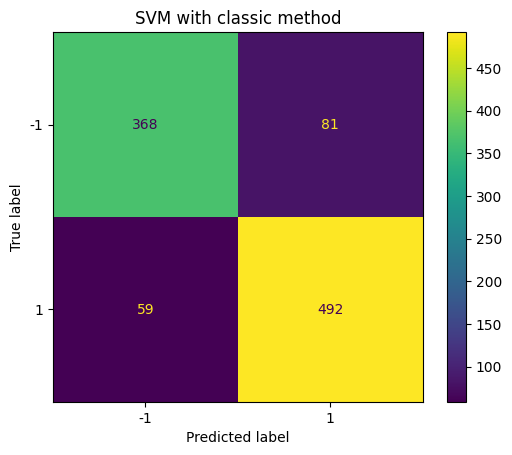

ACC = 0.86, F1 = 0.8754448398576512, PPV = 0.8586387434554974, NPV = 0.8618266978922716, TPR = 0.8929219600725953, TNR = 0.8195991091314031, FPR = 0.18040089086859687, FNR = 0.10707803992740472

TP = 492, FP = 81, TN = 368, FN = 59


In [8]:
metricsClassic = EvaluateModel(model, Xts, Yts, f"SVM with {model.method} method")


FPR is here the rate of _collisions_ being  _misclassified_ as _non-collisions_.

Scalable SVM allows to find a suitable $\rho$ to keep $FPR\leq\varepsilon$ 

### 2) Probabilistic Safety Region

In [10]:
modelPS = model.FPcontrol(Xcal, Ycal, 0.1,'ps')
print(modelPS.b_eps)

0.21848733887564797


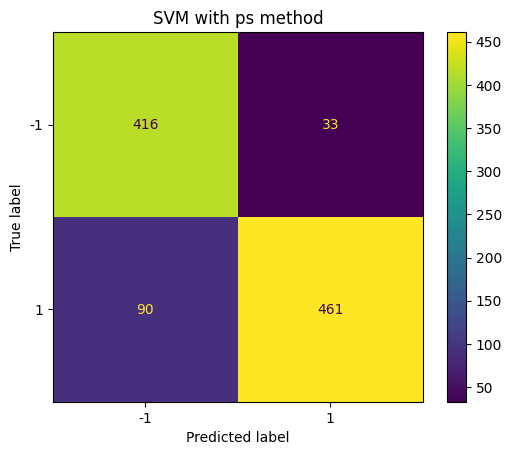

ACC = 0.877, F1 = 0.8822966507177034, PPV = 0.9331983805668016, NPV = 0.8221343873517787, TPR = 0.8366606170598911, TNR = 0.9265033407572383, FPR = 0.07349665924276169, FNR = 0.16333938294010888

TP = 461, FP = 33, TN = 416, FN = 90


In [11]:
metricsPSR = EvaluateModel(modelPS, Xts, Yts, f"SVM with {model.method} method")

Now FPR is reduced below $\varepsilon$, while maintaining a good portion of non collision points within the safety region (83.6%)

In [13]:
y_ps_ts = modelPS.predict(Xts)
testPS = pd.DataFrame(np.hstack((Xts,Yts,y_ps_ts.reshape(len(Xts),1))), columns = ["SafetyMargin","Eta","Tau","y_true","y_conformal"])


**Relationship between $\varepsilon$ and $\rho_\varepsilon$**

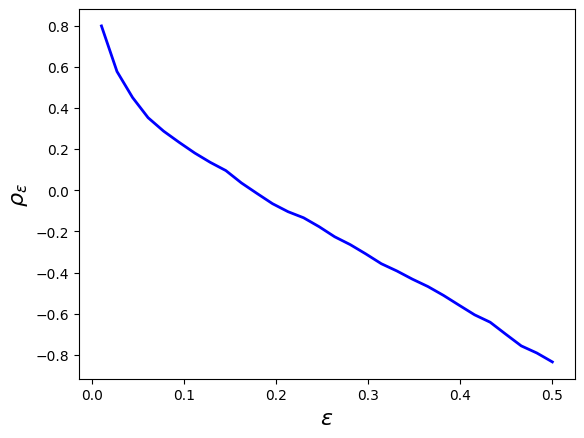

In [14]:
epsilon_values = np.linspace(0.01, 0.5, 30)
rho_epsilon_values = []
for epsilon in epsilon_values:
    model_rho = model.FPcontrol(Xcal, Ycal, epsilon,'ps')
    rho_epsilon_values.append(model_rho.b_eps)

plt.plot(epsilon_values, rho_epsilon_values, 'b', linewidth = 2)
plt.xlabel(r"$\varepsilon$", fontsize = 16)
plt.ylabel(r"$\rho_\varepsilon$", fontsize = 16)
plt.show()

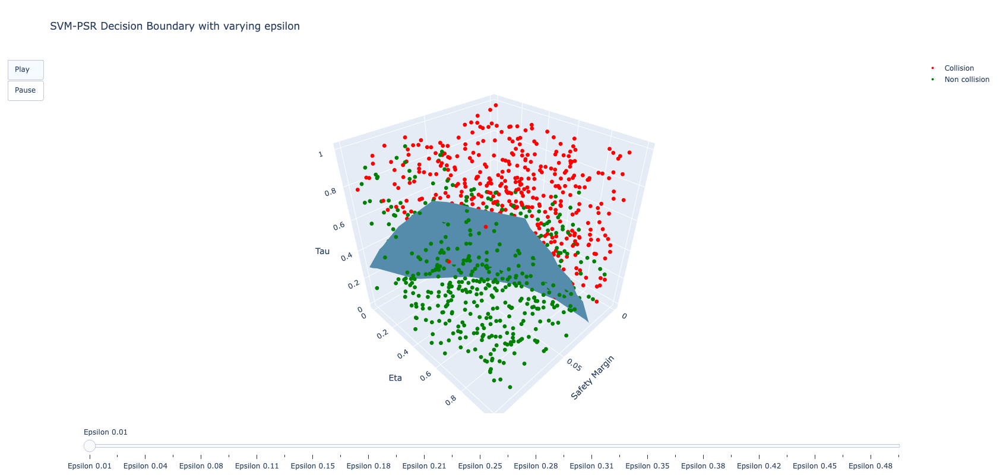

In [15]:
mask_collision = (Yts.ravel() == -1)
mask_noncollision = ~mask_collision

epsilon_values = np.linspace(0.01, 0.5, 30)  

sm_min, sm_max = 0.0, 0.1
eta_min, eta_max = 0, 1
tau_min, tau_max = 0, 1
resolution = 5  

xx, yy, zz = np.meshgrid(
    np.linspace(sm_min, sm_max, resolution),
    np.linspace(eta_min, eta_max, resolution),
    np.linspace(tau_min, tau_max, resolution),
)


fig = go.Figure()


frames = []
initial_predictions = None  

for eps in epsilon_values:
    model = model.FPcontrol(Xcal, Ycal, eps,'ps')


    grid_points = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
    predictions = model.decision_function(grid_points).reshape(xx.shape)


    if initial_predictions is None:
        initial_predictions = predictions

    frames.append(go.Frame(
        name=f"Epsilon {eps:.2f}",
        data=[
            go.Isosurface(
                x=xx.ravel(), y=yy.ravel(), z=zz.ravel(),
                value=predictions.ravel(),
                isomin=0, isomax=0, surface_count=1,
                colorscale='Blues', showscale=False
            )

        ]
    ))


fig.add_trace(go.Isosurface(
    x=xx.ravel(), y=yy.ravel(), z=zz.ravel(),
    value=initial_predictions.ravel(),
    isomin=0, isomax=0, surface_count=1,
    colorscale='Blues', showscale=False
))


fig.add_trace(go.Scatter3d(
    x=Xts[mask_collision, 0],
    y=Xts[mask_collision, 1],
    z=Xts[mask_collision, 2],
    mode='markers',
    marker=dict(size=4, color='red'),
    name='Collision'
))

fig.add_trace(go.Scatter3d(
    x=Xts[mask_noncollision, 0],
    y=Xts[mask_noncollision, 1],
    z=Xts[mask_noncollision, 2],
    mode='markers',
    marker=dict(size=4, color='green'),
    name='Non collision'
))


fig.frames = frames


fig.update_layout(
    title='SVM-PSR Decision Boundary with varying epsilon',
    width=800,
    height=800,
    scene=dict(
        xaxis_title="Safety Margin",
        yaxis_title="Eta",
        zaxis_title="Tau"
    ),
    updatemenus=[dict(
        type="buttons",
        showactive=True,
        buttons=[
            dict(label="Play",
                 method="animate",
                 args=[None, dict(frame=dict(duration=500, redraw=True), fromcurrent=True)]),
            dict(label="Pause",
                 method="animate",
                 args=[[None], dict(frame=dict(duration=0, redraw=False), mode="immediate")])
        ]
    )],
    sliders=[dict(
        steps=[dict(
            method="animate",
            args=[[frame.name], dict(mode="immediate", frame=dict(duration=500, redraw=True))],
            label=frame.name
        ) for frame in frames],
        active=0
    )]
)
fig.write_html("animationPSR.html", auto_open=False)

fig.show()


### 3) Conformal Safety Regions


In [9]:
modelCP = model.FPcontrol(Xcal, Ycal, 0.1,'cp')
modelCP.b_eps

0.14513570906707723

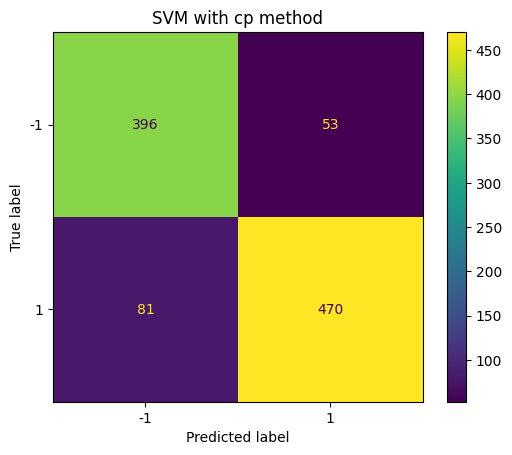

ACC = 0.866, F1 = 0.8752327746741154, PPV = 0.8986615678776291, NPV = 0.8301886792452831, TPR = 0.852994555353902, TNR = 0.8819599109131403, FPR = 0.11804008908685969, FNR = 0.147005444646098

TP = 470, FP = 53, TN = 396, FN = 81


In [10]:
metricsCSR = EvaluateModel(modelCP, Xts, Yts, f"SVM with {model.method} method")

In [11]:
y_cp_ts = modelCP.predict(Xts)
testCP = pd.DataFrame(np.hstack((Xts,Yts,y_cp_ts.reshape(len(Xts),1))), columns = ["SafetyMargin","Eta","Tau","y_true","y_conformal"])


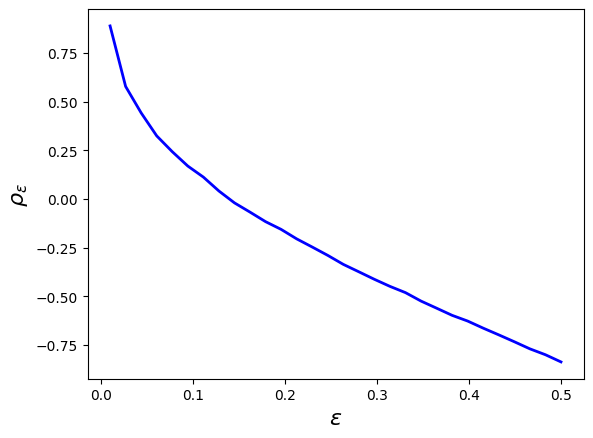

In [13]:
epsilon_values = np.linspace(0.01,0.5, 30)
rho_epsilon_values = []
for epsilon in epsilon_values:
    model_rho = model.FPcontrol(Xcal, Ycal, epsilon,'cp')
    rho_epsilon_values.append(model_rho.b_eps)

plt.plot(epsilon_values, rho_epsilon_values, 'b', linewidth = 2)
plt.xlabel(r"$\varepsilon$", fontsize = 16)
plt.ylabel(r"$\rho_\varepsilon$", fontsize = 16)
plt.show()

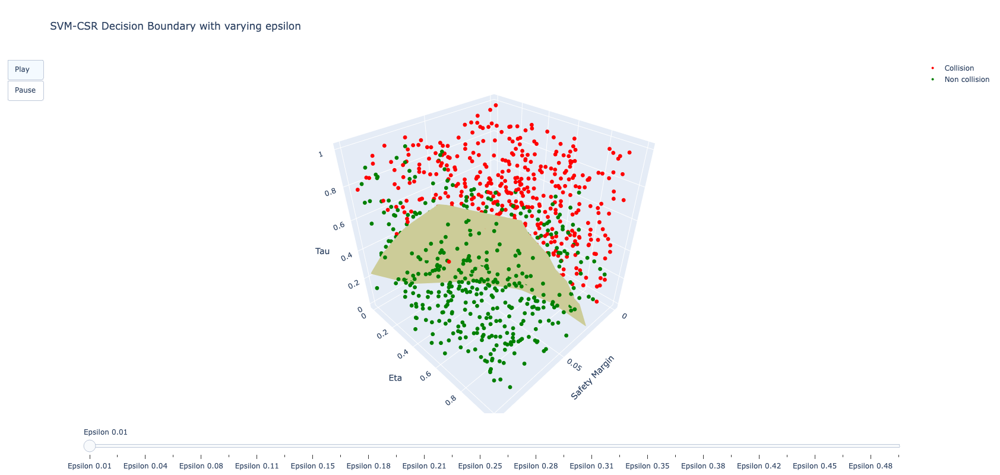

In [14]:
fig = go.Figure()


frames = []
initial_predictions = None  

mask_collision = (Yts.ravel() == -1)
mask_noncollision = ~mask_collision

epsilon_values = np.linspace(0.01, 0.5, 30)  

sm_min, sm_max = 0.0, 0.1
eta_min, eta_max = 0, 1
tau_min, tau_max = 0, 1
resolution = 5  

xx, yy, zz = np.meshgrid(
    np.linspace(sm_min, sm_max, resolution),
    np.linspace(eta_min, eta_max, resolution),
    np.linspace(tau_min, tau_max, resolution),)


for eps in epsilon_values:
    model = model.FPcontrol(Xcal, Ycal, eps,'cp')


    grid_points = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
    predictions = model.decision_function(grid_points).reshape(xx.shape)


    if initial_predictions is None:
        initial_predictions = predictions

    frames.append(go.Frame(
        name=f"Epsilon {eps:.2f}",
        data=[
            go.Isosurface(
                x=xx.ravel(), y=yy.ravel(), z=zz.ravel(),
                value=predictions.ravel(),
                isomin=0, isomax=0, surface_count=1,
                colorscale='RdYlGn', showscale=False
            )
        ]
    ))


fig.add_trace(go.Isosurface(
    x=xx.ravel(), y=yy.ravel(), z=zz.ravel(),
    value=initial_predictions.ravel(),
    isomin=0, isomax=0, surface_count=1,
    colorscale='RdYlGn', showscale=False
))



fig.add_trace(go.Scatter3d(
    x=Xts[mask_collision, 0],
    y=Xts[mask_collision, 1],
    z=Xts[mask_collision, 2],
    mode='markers',
    marker=dict(size=4, color='red'),
    name='Collision'
))

fig.add_trace(go.Scatter3d(
    x=Xts[mask_noncollision, 0],
    y=Xts[mask_noncollision, 1],
    z=Xts[mask_noncollision, 2],
    mode='markers',
    marker=dict(size=4, color='green'),
    name='Non collision'
))


fig.frames = frames


fig.update_layout(
    title='SVM-CSR Decision Boundary with varying epsilon',
    width=800,
    height=800,
    scene=dict(
        xaxis_title="Safety Margin",
        yaxis_title="Eta",
        zaxis_title="Tau"
    ),
    updatemenus=[dict(
        type="buttons",
        showactive=True,
        buttons=[
            dict(label="Play",
                 method="animate",
                 args=[None, dict(frame=dict(duration=500, redraw=True), fromcurrent=True)]),
            dict(label="Pause",
                 method="animate",
                 args=[[None], dict(frame=dict(duration=0, redraw=False), mode="immediate")])
        ]
    )],
    sliders=[dict(
        steps=[dict(
            method="animate",
            args=[[frame.name], dict(mode="immediate", frame=dict(duration=500, redraw=True))],
            label=frame.name
        ) for frame in frames],
        active=0
    )]
)
fig.write_html("animationCSR.html", auto_open=False)

fig.show()


# PART B) 
## Rule Extraction from Probabilistic Safety Regions boundary

### 1) Anchor generation from PSR

- **Candidate points close to PSR boundary**

Text(0, 0.5, 'Count')

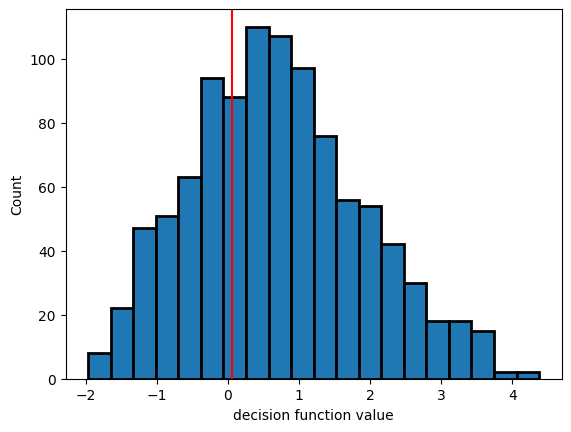

In [23]:
# setup a threshold on the distance to scalable SVM boundary
d_thresh = 0.05

# get distances of test points from decision boundary
d_test = modelPS.decision_function(Xts)

plt.hist(d_test,bins = 20, edgecolor = "black",linewidth=2)
plt.gca().axvline(x=d_thresh, color = "red")
plt.xlabel("decision function value")
plt.ylabel("Count")

In [24]:
#y_ps_ts = y_ps_ts.ravel()
border_points_idx = np.where((d_test < 0) & (abs(d_test) < d_thresh) & (y_ps_ts == 1))[0]

selected_points = Xts[list(border_points_idx),:]

print(f"# of candidate points: {len(selected_points)}")

# of candidate points: 17


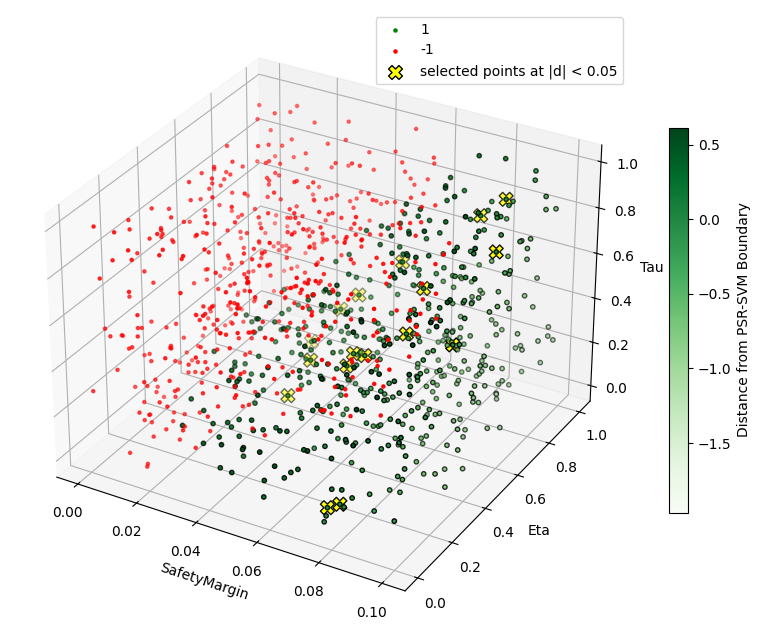

In [25]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(projection='3d')

sc0 = ax.scatter3D(Xts[:,0][y_ps_ts == -1], Xts[:,1][y_ps_ts == -1], Xts[:,2][y_ps_ts == -1], s=5, c= "red")
scsafe = ax.scatter3D(Xts[:,0][y_ps_ts == 1], Xts[:,1][y_ps_ts == 1], Xts[:,2][y_ps_ts == 1], s=5, c= "green")

sc1 = ax.scatter3D(Xts[:,0][y_ps_ts == 1], Xts[:,1][y_ps_ts == 1], Xts[:,2][y_ps_ts == 1], s=10, c=d_test[y_ps_ts == 1], cmap = "Greens", edgecolors = "k")

sc2 = ax.scatter3D(selected_points[:,0],selected_points[:,1], selected_points[:,2],s=100, marker = 'X', facecolors="yellow", edgecolors="k")

ax.set_xlabel("SafetyMargin")
ax.set_ylabel("Eta")
ax.set_zlabel("Tau")



ax.legend([scsafe, sc0,sc2], ["1","-1",f"selected points at |d| < {d_thresh}"], loc="upper right")
plt.colorbar(sc1, label = "Distance from PSR-SVM Boundary", shrink = 0.5)

plt.show()

In [26]:
feature_labels = ["SafetyMargin","Eta","Tau"]
res_path = datapath+"resultsPSR/"
if not exists(res_path):
    os.mkdir(res_path)
results_anchorfile = "anchors-psr.csv"


anchors_ssvm = GenerateAnchorRules(modelPS, Xtr, selected_points, y_ps_ts[list(border_points_idx)], Yts.ravel()[list(border_points_idx)], [i[0] for i in list(enumerate(selected_points))], feature_labels, list(modelPS.classes_), precision_threshold = 0.5, filepath = res_path+results_anchorfile)

Elapsed time [sec] - Anchors for 17 test points: 47.311758041381836


### 2) Evaluation of the obtained Anchors

In [27]:
rules = pd.read_csv(res_path+results_anchorfile)
rules_noncoll_unique = rules.drop_duplicates(subset = "AnchorConditions")
rules_noncoll_unique

,Index,AnchorConditions,Coverage,Precision,AnchorOutput,ModelOutput,RealOutput
0,0,SafetyMargin > 0.07,0.2498,0.671053,1.0,1.0,1
2,2,SafetyMargin > 0.05,0.4978,0.501470,1.0,1.0,1
3,3,Tau <= 0.25,0.2467,0.559441,1.0,1.0,1
6,6,Eta > 0.76 AND Tau <= 0.51,0.1235,0.613408,1.0,1.0,1


In [28]:
preds_by_rule = evaluate_rules(testPS, rules_noncoll_unique, "y_true")

rule: SafetyMargin > 0.07
tp = 273, tn = 410, fp = 39, fn = 278
precision: 0.88, covering: 0.50, error: 0.09, accuracy: 0.68, f1: 0.63

rule: SafetyMargin > 0.05
tp = 417, tn = 362, fp = 87, fn = 134
precision: 0.83, covering: 0.76, error: 0.19, accuracy: 0.78, f1: 0.79

rule: Tau <= 0.25
tp = 202, tn = 391, fp = 58, fn = 349
precision: 0.78, covering: 0.37, error: 0.13, accuracy: 0.59, f1: 0.50

rule: Eta > 0.76 AND Tau <= 0.51
tp = 120, tn = 423, fp = 26, fn = 431
precision: 0.82, covering: 0.22, error: 0.06, accuracy: 0.54, f1: 0.34



Now, we choose the 2 anchors scoring the lowest error (i.e., collision points wrongly satisfying non-collision rules). Therefore, we can explore their union in providing a good approximation of the PSR.

In [29]:
verified1 = (Xts[:,0] > 0.07)

verified2 = (Xts[:,2] <= 0.25) 

verified_or = verified1 | verified2
prec, cov, acc, fscore, err = ComputeMetricsForRule(verified_or, Yts.ravel())
print(f"precision: {prec:.2f}, covering: {cov:.2f}, accuracy: {acc:.2f}, f1: {fscore:.2f}, error: {err:.3f}")                                                             

tp = 390, tn = 352, fp = 97, fn = 161
precision: 0.80, covering: 0.71, accuracy: 0.74, f1: 0.75, error: 0.199


# PSR + Anchors visualization

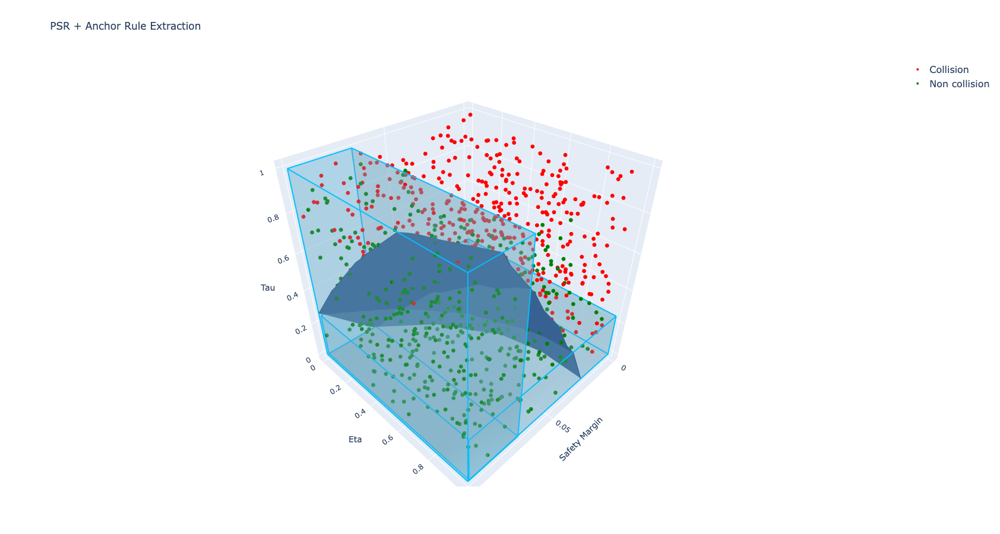

In [31]:
def plot_rule(fig, vertices, face_color, edge_color, name):
    edges = [
        (0, 1), (1, 2), (2, 3), (3, 0),  # bottom face
        (4, 5), (5, 6), (6, 7), (7, 4),  # top face
        (0, 4), (1, 5), (2, 6), (3, 7)   # vertical edges
    ]

    xs, ys, zs = zip(*vertices)
    
    triangles = [
        [0, 1, 2], [0, 2, 3],
        [4, 5, 6], [4, 6, 7],
        [0, 1, 5], [0, 5, 4],
        [2, 3, 7], [2, 7, 6],
        [0, 3, 7], [0, 7, 4],
        [1, 2, 6], [1, 6, 5]
    ]
    i, j, k = [], [], []
    for tri in triangles:
        i.append(tri[0])
        j.append(tri[1])
        k.append(tri[2])
    fig.add_trace(go.Mesh3d(
        x=xs,
        y=ys,
        z=zs,
        i=i,
        j=j,
        k=k,
        color=face_color,
        opacity=0.3,
        name=name,
        showscale=False
    ))
    
    edge_x, edge_y, edge_z = [], [], []
    for edge in edges:
        start, end = edge
        edge_x.extend([xs[start], xs[end], None])
        edge_y.extend([ys[start], ys[end], None])
        edge_z.extend([zs[start], zs[end], None])
    
    fig.add_trace(go.Scatter3d(
        x=edge_x,
        y=edge_y,
        z=edge_z,
        mode='lines',
        line=dict(color=edge_color, width=4),
        name=name + " edges",
        showlegend=False
    ))

sm_min, sm_max = 0.0, 0.1
eta_min, eta_max = 0, 1
tau_min, tau_max = 0, 1
resolution = 5  

xx, yy, zz = np.meshgrid(
    np.linspace(sm_min, sm_max, resolution),
    np.linspace(eta_min, eta_max, resolution),
    np.linspace(tau_min, tau_max, resolution),
)


grid_points = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
predictions = modelPS.decision_function(grid_points).reshape(xx.shape) 

colors = np.where(Yts.ravel() == -1, 'red', 'green').tolist()

fig = go.Figure()


fig.add_trace(go.Isosurface(
    x=xx.ravel(), 
    y=yy.ravel(), 
    z=zz.ravel(), 
    value=predictions.ravel(),
    isomin=0, 
    isomax=0, 
    surface_count=1,
    colorscale='ice',
    showscale=False  
))


mask_collision = (Yts.ravel() == -1)
mask_noncollision = ~mask_collision

fig.add_trace(go.Scatter3d(
    x=Xts[mask_collision, 0],
    y=Xts[mask_collision, 1],
    z=Xts[mask_collision, 2],
    mode='markers',
    marker=dict(size=4, color='red'),
    name='Collision'
))

fig.add_trace(go.Scatter3d(
    x=Xts[mask_noncollision, 0],
    y=Xts[mask_noncollision, 1],
    z=Xts[mask_noncollision, 2],
    mode='markers',
    marker=dict(size=4, color='green'),
    name='Non collision'
))


mask1 = Xts[:, 0] > 0.07
if np.any(mask1):
    x_min, x_max = Xts[mask1, 0].min(), Xts[mask1, 0].max()
    y_min, y_max = Xts[mask1, 1].min(), Xts[mask1, 1].max()
    z_min, z_max = Xts[mask1, 2].min(), Xts[mask1, 2].max()

    vertices1 = [
        [x_min, y_min, z_min],
        [x_max, y_min, z_min],
        [x_max, y_max, z_min],
        [x_min, y_max, z_min],
        [x_min, y_min, z_max],
        [x_max, y_min, z_max],
        [x_max, y_max, z_max],
        [x_min, y_max, z_max]
    ]
    plot_rule(fig, vertices1, 'skyblue','deepskyblue', 'Anchor1')


mask2 = Xts[:, 2] <= 0.25
if np.any(mask2):
    x_min, x_max = Xts[mask2, 0].min(), Xts[mask2, 0].max()
    y_min, y_max = Xts[mask2, 1].min(), Xts[mask2, 1].max()
    z_min, z_max = Xts[mask2, 2].min(), Xts[mask2, 2].max()
    vertices2 = [
        [x_min, y_min, z_min],
        [x_max, y_min, z_min],
        [x_max, y_max, z_min],
        [x_min, y_max, z_min],
        [x_min, y_min, z_max],
        [x_max, y_min, z_max],
        [x_max, y_max, z_max],
        [x_min, y_max, z_max]
    ]
    plot_rule(fig, vertices2, 'skyblue', 'deepskyblue', 'Anchor2')


fig.update_layout(
    title="PSR + Anchor Rule Extraction",
    width=900,
    height=900,
    scene=dict(
        xaxis_title="Safety Margin",
        yaxis_title="Eta",
        zaxis_title="Tau"
    ),
    legend=dict(
        font=dict(
            size=16
        )
    ),
)

fig.show()


# Try yourself hint!
## What about extracting rules from Conformal Safety Regions?
